In [1]:
import os, yaml, zipfile, shutil, torch, glob
from ultralytics import YOLO
from IPython.display import Image, display
from utils.create_data_yaml import create_data_yaml_from_set_and_classes
from utils.get_notebook_path import get_notebook_path
from utils.clear_folder import clear_folder
from utils.data_cleaning import data_cleaning
from utils.preview_labels import preview_labels
from utils.analyze_imgsz import analyze_imgsz
from utils.data_preprocess import data_preprocess

# Introduction

This notebook uses [Ultralytics](https://docs.ultralytics.com/) to train YOLO11, YOLOv8, or YOLOv5 object detection models with a custom dataset.

**Verify NVIDIA GPU Availability**

In [2]:
!nvidia-smi

Fri May  1 16:21:34 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.02              Driver Version: 560.94         CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1050 Ti     On  |   00000000:01:00.0  On |                  N/A |
| 30%   29C    P8             N/A /   75W |     275MiB /   4096MiB |     10%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**Option 1. Upload the Dataset**

Upload the `data.zip` (Export from Label studio) to the root folder.

## 2. Split images into train and validation folders
Next, we'll unzip `data.zip` and create some folders to hold the images.

In [3]:
# Extract custom_data (required)
extract_dir = "dataset/custom_data"
zip_path = "dataset/data.zip"

clear_folder(extract_dir)

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# Extract set (optional)
set_extract_dir = "dataset/set"
set_zip_path = "dataset/set.zip"

if os.path.exists(set_zip_path):
    clear_folder(set_extract_dir)
    os.makedirs(set_extract_dir, exist_ok=True)
    with zipfile.ZipFile(set_zip_path, 'r') as zip_ref:
        zip_ref.extractall(set_extract_dir)
else:
    print("dataset/set.zip not found; skipping set extraction.")

dataset/set.zip not found; skipping set extraction.


Now we will build the Ultralytics folder structure under `data/` by merging:

- `dataset/set/` (from `set.zip`): copy `train` and `valid` (and optionally `test`) into `data/`.
- `dataset/custom_data/`: split 80/20 (configurable) and append into `data/train` and `data/validation`.

The script avoids filename collisions and pairs each image with its corresponding label.

In [4]:
clear_folder("data")
!python -m utils.merge_datasets --set_dir dataset/set --custom_dir dataset/custom_data --data_dir data --train_pct 0.9 --include_test

# 4.&nbsp;Configure Training


There's one last step before training: create `data.yaml`. We'll take the class names (`names` and `nc`) directly from `dataset/set/data.yaml`, and point `train`/`val` to our merged `data/` folders.

In [5]:
path_to_set_yaml = 'dataset/set/data.yaml'
path_to_classes_txt = 'dataset/custom_data/classes.txt'
path_to_data_yaml = 'data.yaml'

create_data_yaml_from_set_and_classes(path_to_set_yaml, path_to_classes_txt, path_to_data_yaml)

print('\nFile contents:\n')
with open("data.yaml", "r") as f:
    print(f.read())


Created config file at data.yaml from union of dataset/set/data.yaml and dataset/custom_data/classes.txt

File contents:

path: data_preprocessed
train: train/images
val: validation/images
nc: 25
names:
- Alison Segura
- Alison Tinoco
- Andrea Lopez
- Anyi Becerra
- Ashly Aguirre
- Brayan Gomez
- Breiner Bonilla
- "Carlos \xC1ngulo"
- Cristhian Tapiero
- Daniela Fierro
- "Diego Pati\xF1o"
- Evelin Sanchez
- Jeferson Castellanos
- Johel Arias
- Juan Toro
- Karol Zubieta
- "Laura Bar\xF3n"
- Laura Perez
- Marcela Cifuentes
- Mauricio Alonso
- "Pablo Carre\xF1o"
- Rodrigo Castro
- "Sara C\xE1rdenas"
- Valery Guerrero
- Valery Guzman



# 5.&nbsp;Train Model

## 5.1 Training Parameters

**Model architecture & size (`model`):**

There are several YOLO11 models sizes available to train, including `yolo11n.pt`, `yolo11s.pt`, `yolo11m.pt`, `yolo11l.pt`, and `yolo11xl.pt`. Larger models run slower but have higher accuracy, while smaller models run faster but have lower accuracy. 

Example: [check it out here to get a sense of their speed accuracy](https://youtu.be/_WKS4E9SmkA). 
By default, `yolo11s.pt` will be used as the starting point.

We can also train with YOLOv8 or YOLOv5 models by substituting `yolo11` for `yolov8` or `yolov5`.


**Number of epochs (`epochs`)**
In machine learning, one “epoch” is one single pass through the full training dataset. Setting the number of epochs dictates how long the model will train for. The best amount of epochs to use depends on the size of the dataset and the model architecture. 

In our case we will use 60 epochs. 
If your dataset has more than 200 images, a good starting point is 40 epochs.


**Resolution (`imgsz`)**
Resolution has a large impact on the speed and accuracy of the model: a lower resolution model will have higher speed but less accuracy. 
YOLO models are typically trained and inferenced at a 640x640 resolution. 

We can choose to lower the resolution to 480x480 for better model performance


model = Specifies the model to use
epochs = Specifies the number of training epochs
imgsz = Specifies the resolution of the images

In [6]:
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detectada")

True
NVIDIA GeForce GTX 1050 Ti


In [7]:
data_cleaning()

✔ Proceso finalizado. Imágenes eliminadas: 0
✔ Proceso finalizado. Imágenes eliminadas: 0
✔ Labels corruptos eliminados: 0
✔ Labels corruptos eliminados: 0
✔ Imágenes corruptas eliminadas: 0
✔ Imágenes corruptas eliminadas: 0
Duplicado eliminado: data/train/images/a35340e0-WhatsApp_Image_2026-03-12_at_4.57.46_PM.jpeg
Duplicado eliminado: data/train/images/cd9e3a73-IMG-20251030-WA0024.jpg
Duplicado eliminado: data/train/images/ca5fd9c2-WhatsApp_Image_2026-03-12_at_4.57.46_PM.jpeg
Duplicado eliminado: data/train/images/4079e9b5-imagen_0003.jpg
Duplicado eliminado: data/train/images/fbeb8a2c-IMG_20250912_090220.jpg
Duplicado eliminado: data/train/images/5d157952-IMG_20250128_200607.jpg
Duplicado eliminado: data/train/images/09459f8f-IMG-20251030-WA0024.jpg
Duplicado eliminado: data/train/images/60881ecc-IMG_20250127_204048.jpg
Duplicado eliminado: data/train/images/fcc96c7f-IMG_20250223_193051.jpg
Duplicado eliminado: data/train/images/842fd228-imagen_0030_11.jpg
Duplicado eliminado: data

In [8]:
clear_folder("previews/")
preview_labels(data_path="data")

✔ Previews generados en: previews/preview_train
✔ Previews generados en: previews/preview_val


In [2]:
analyze_imgsz()

Analizando TRAIN...
Analizando VALIDATION...

--- RESULTADOS TRAIN ---

--- Etiquetas por clase (TRAIN) ---
  Alison Segura: 48
  Alison Tinoco: 40
  Andrea Lopez: 52
  Anyi Becerra: 17
  Ashly Aguirre: 21
  Brayan Gomez: 20
  Breiner Bonilla: 11
  Carlos Ángulo: 14
  Cristhian Tapiero: 6
  Daniela Fierro: 38
  Diego Patiño: 36
  Evelin Sanchez: 17
  Jeferson Castellanos: 39
  Johel Arias: 114
  Juan Toro: 36
  Karol Zubieta: 55
  Laura Barón: 86
  Laura Perez: 49
  Marcela Cifuentes: 18
  Mauricio Alonso: 10
  Pablo Carreño: 42
  Rodrigo Castro: 5
  Sara Cárdenas: 22
  Valery Guerrero: 11
  Valery Guzman: 23
Total etiquetas: 830
count: 814
height_median: 346.8301329394386
height_mean: 502.53428632690355
height_p25: 217.2082717872969
height_p75: 600.5317577548008
width_median: 238.55243722304286
area_median: 82862.91780795013
Recomendación imgsz (train): 416 - 640 (recomendado 512 o 416 si GPU limitada)

--- RESULTADOS VALIDATION ---

--- Etiquetas por clase (VALIDATION) ---
  Alison S

In [10]:
PREPROCESSED_DATA_FOLDER = "data_preprocessed"

clear_folder(PREPROCESSED_DATA_FOLDER)
data_preprocess(datap_path=PREPROCESSED_DATA_FOLDER)
preview_labels(data_path=PREPROCESSED_DATA_FOLDER)

🔧 Procesando train…
✔ train completado.

🔧 Procesando validation…
✔ validation completado.

🔧 Procesando test…
✔ test completado.

🎉 Dataset preprocesado creado en: data_preprocessed
✔ Previews generados en: previews/preview_train
✔ Previews generados en: previews/preview_val


In [11]:
# clear_folder("runs/detect/train")

model = YOLO("yolo11s.pt")

model.train(
    data="data.yaml",
    model="yolo11s.pt",
    epochs=60,
    imgsz=640,
    batch=16,
    workers=8,
    amp=True,

    # AUGMENTATION — VALIDADO PARA YOLO11
    hsv_h=0.015,       # variación ligera de tono
    hsv_s=0.7,         # saturación fuerte (útil en exteriores)
    hsv_v=0.4,         # variación de brillo moderada
    degrees=5.0,       # rotación suave (personas no deben rotarse mucho)
    translate=0.10,    # desplazamiento leve
    scale=0.50,        # zoom in/out moderado
    shear=1.5,         # deformación suave
    perspective=0.0005,# perspectiva muy ligera
    flipud=0.0,        # NO voltear verticalmente personas
    fliplr=0.5,        # flip horizontal sí es natural
    mosaic=1.0,        # mosaico activado (muy útil)
    mixup=0.10,        # mezcla suave
    copy_paste=0.0,    # no recomendado para humanos
    erasing=0.4,       # borrado aleatorio útil, sin exagerar
    crop_fraction=1.0, # 1.0 = sin recorte agresivo
)

New https://pypi.org/project/ultralytics/8.4.46 available 😃 Update with 'pip install -U ultralytics'
WARNING ⚠️ 'crop_fraction' is deprecated and will be removed in the future.
Ultralytics 8.3.221 🚀 Python-3.13.9 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce GTX 1050 Ti, 4096MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=5.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolo11s.pt, momentum=0.937, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x74e15484cf30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([0.        , 0.001001  , 0.002002  , 0.003003  , 0.004004  ,
       0.00500501, 0.00600601, 0.00700701, 0.00800801, 0.00900901,
       0.01001001, 0.01101101, 0.01201201, 0.01301301, 0.01401401,
       0.01501502, 0.01601602, 0.01701702, 0.01801802, 0.01901902,
       0.02002002, 0.02102102, 0.02202202, 0.02302302, 0.02402402,
       0.02502503, 0.02602603, 0.02702703, 0.02802803, 0.02902903,
       0.03003003, 0.03103103, 0.03203203, 0.03303303, 0.03403403,
       0.03503504, 0.03603604, 0.03703704, 0.03803804, 0.03903904,
       0.04004004, 0.0

The training algorithm will parse the images in the training and validation directories and then start training the model. 

At the end of each training epoch, the program runs the model on the validation dataset and reports the resulting mAP, precision, and recall. As training continues, the mAP should generally increase with each epoch. Training will end once it goes through the number of epochs specified.

The best trained model weights will be saved in `content/runs/detect/train/weights/best.pt`. Additional information about training is saved in the `content/runs/detect/train` folder, including a `results.png` file that shows how loss, precision, recall, and mAP progressed over each epoch.

# 6.&nbsp;Test Model
The commands below run the model on the images in the validation folder and then display the results for the first 10 images.


image 1/79 /home/personal/Projects/ulibre-prometeo/pmai-launcher/pmai-model-vision/data/validation/images/07ba62e9-IMG-20251030-WA0033.jpg: 480x640 1 Andrea Lopez, 82.4ms
image 2/79 /home/personal/Projects/ulibre-prometeo/pmai-launcher/pmai-model-vision/data/validation/images/08b665d7-imagen_0029.jpg: 640x384 1 Laura Perez, 104.0ms
image 3/79 /home/personal/Projects/ulibre-prometeo/pmai-launcher/pmai-model-vision/data/validation/images/0c295a66-imagen_0088_2.jpg: 640x384 1 Alison Segura, 81.1ms
image 4/79 /home/personal/Projects/ulibre-prometeo/pmai-launcher/pmai-model-vision/data/validation/images/0df33423-WhatsApp_Image_2025-10-26_at_21.29.06_a04e8a76.jpg: 640x480 1 Andrea Lopez, 79.8ms
image 5/79 /home/personal/Projects/ulibre-prometeo/pmai-launcher/pmai-model-vision/data/validation/images/1258367b-imagen_0030_12.jpg: 640x384 1 Valery Guerrero, 83.4ms
image 6/79 /home/personal/Projects/ulibre-prometeo/pmai-launcher/pmai-model-vision/data/validation/images/16a74b25-imagen_0019.jpg: 

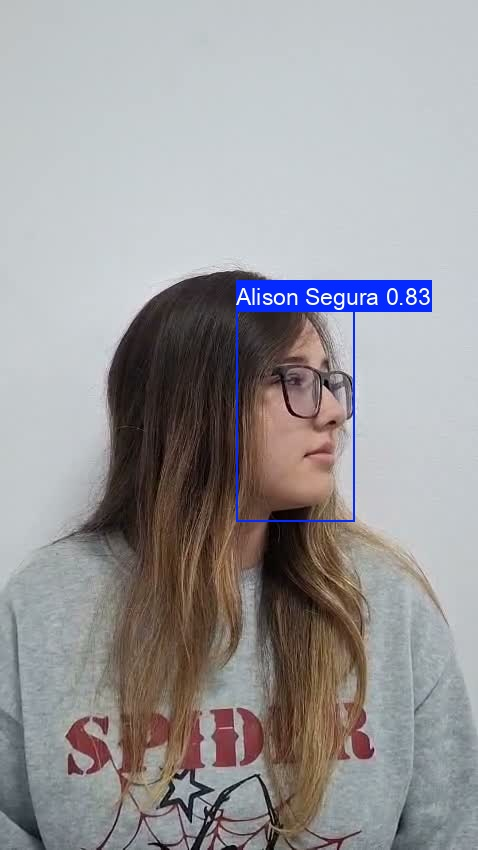

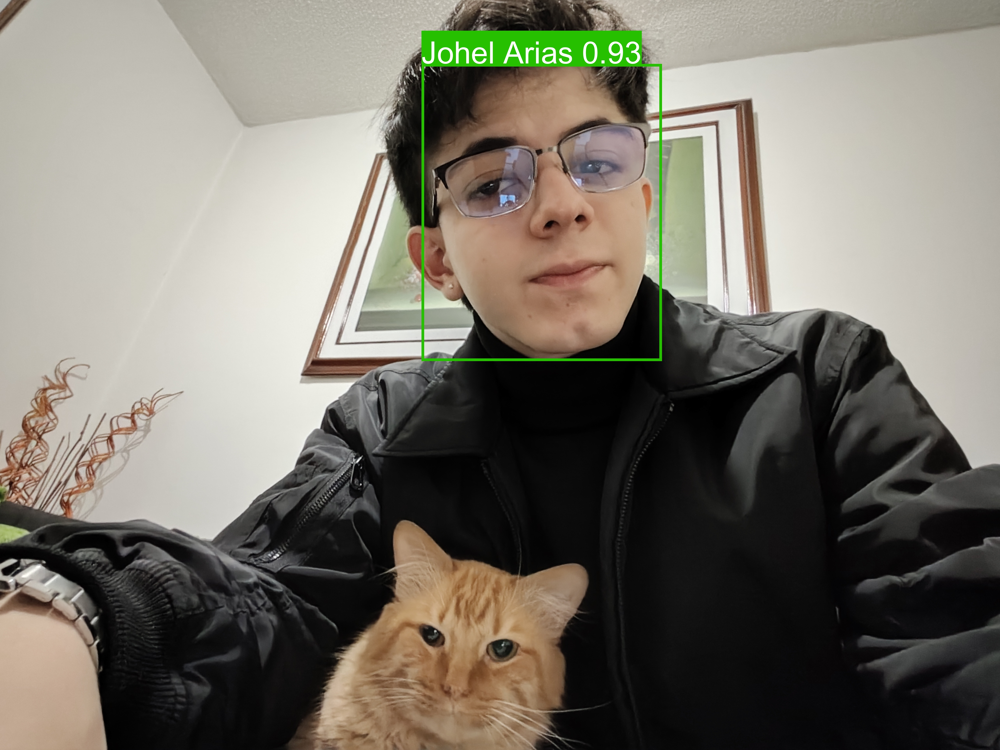

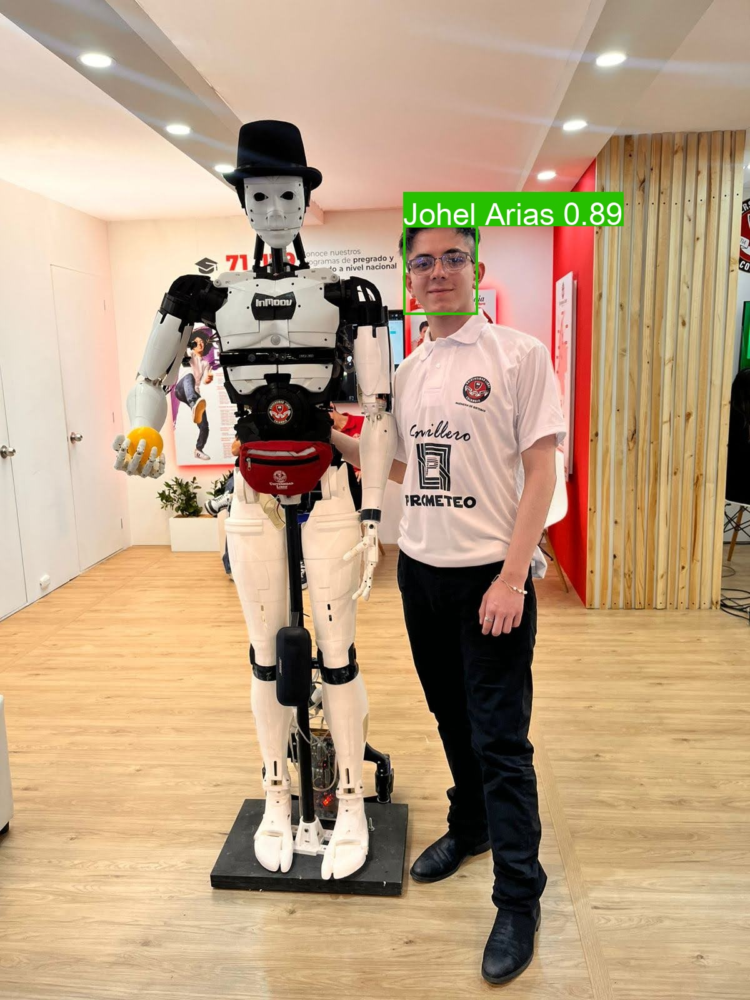

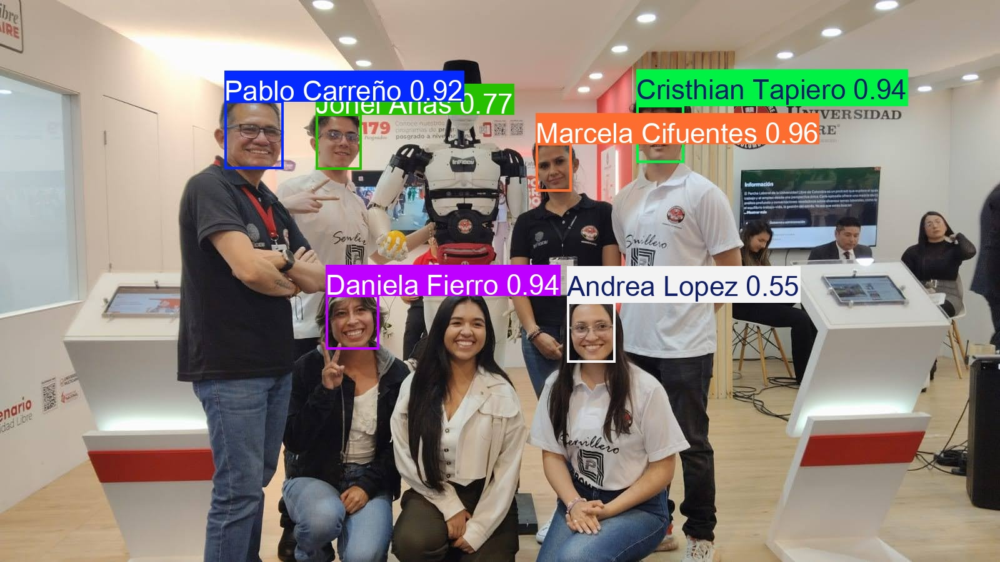

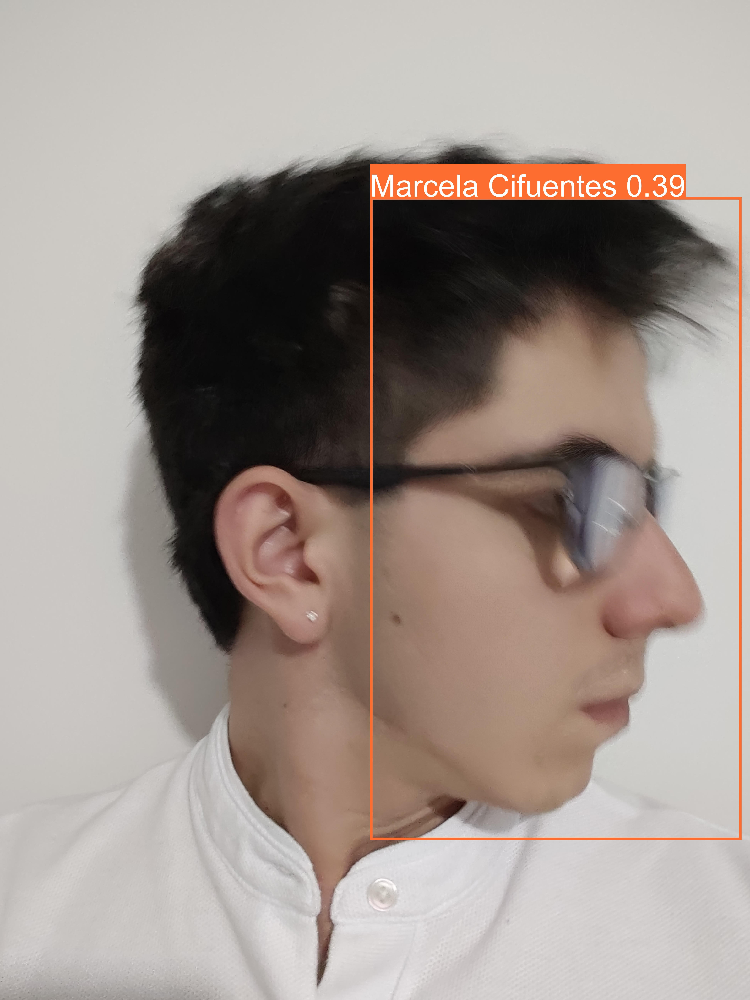

...

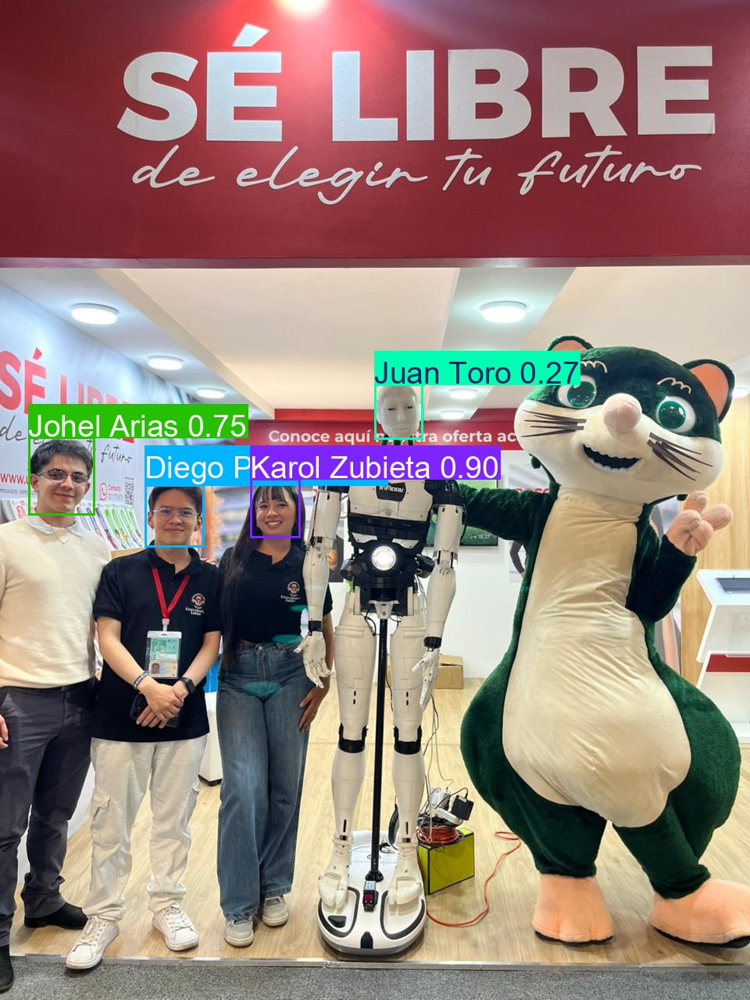

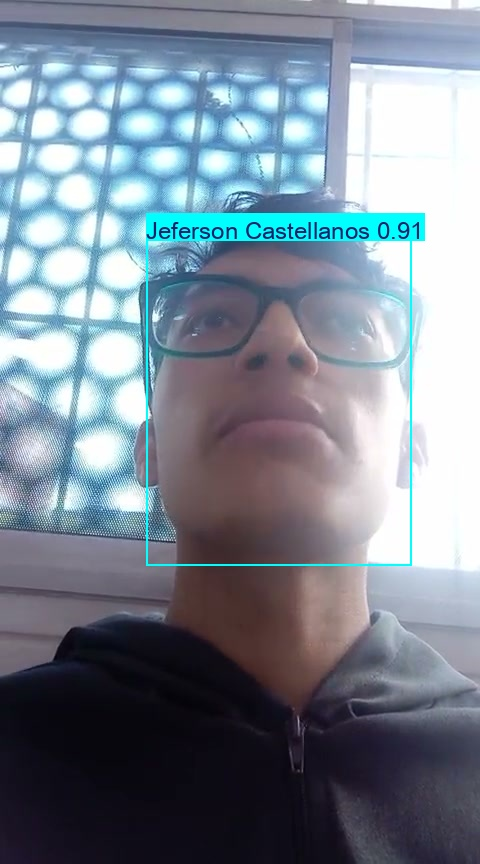

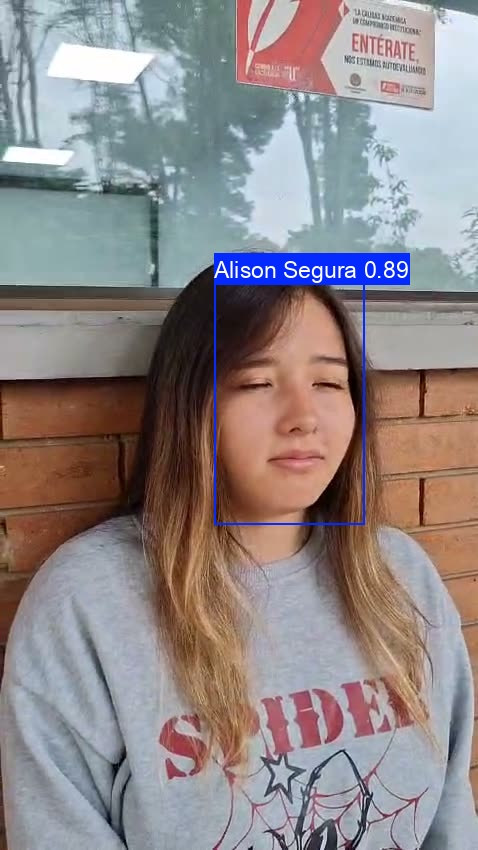

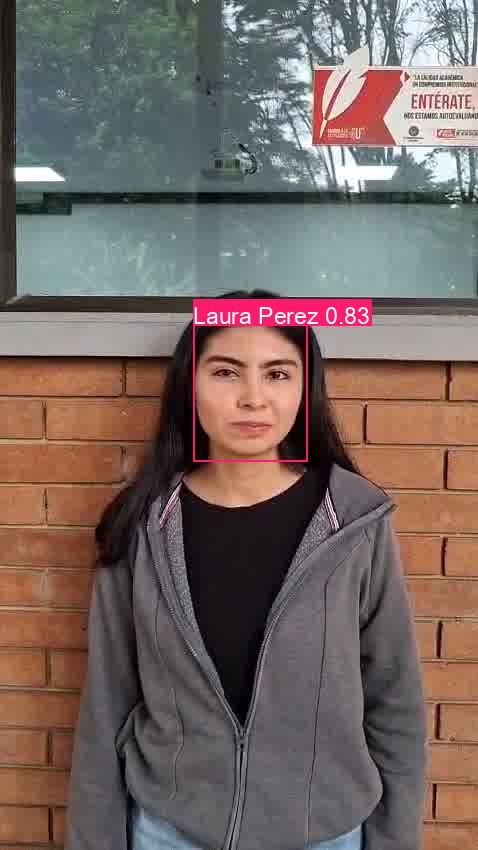

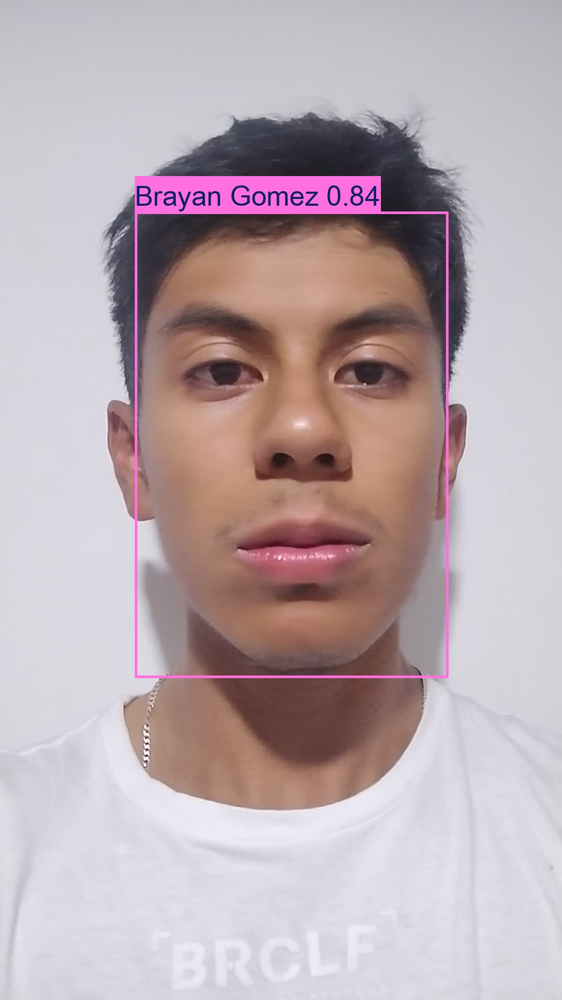

In [12]:
clear_folder("runs/detect/predict")

model = YOLO("runs/detect/train5/weights/best.pt")

results = model.predict(
    source="data/validation/images",  
    save=True,
    show=False,
    conf=0.25
)

for image_path in glob.glob(f'runs/detect/predict/*.jpg')[:20]:
  display(Image(filename=image_path, height=400))
  print('\n')


The model should draw a box around each object of interest in each image.

# 7.&nbsp;Deploy Model

## 7.1 Download YOLO Model

First, zip and download the trained model by running the code blocks below.

The code creates a folder named `my_model`, moves the model weights into it, and renames them from `best.pt` to `my_model.pt`, and also adds the training results for reference.

In [13]:
#clear_folder("my_model")

base_dir = get_notebook_path()
train_dir = os.path.join(base_dir, "runs", "detect", "train5")
output_dir = os.path.join(base_dir, "my_model")

os.makedirs(output_dir, exist_ok=True)

shutil.copy(os.path.join(train_dir, "weights", "best.pt"), os.path.join(output_dir, "my_model.pt"))
shutil.copytree(train_dir, os.path.join(output_dir, "train"), dirs_exist_ok=True)


'/home/personal/Projects/ulibre-prometeo/pmai-launcher/pmai-model-vision/my_model/train'

# 8. Using the model

In [ ]:
!python utils/yolo_detect.py --model my_model/my_model.pt --source usb1 --resolution 1280x720

In [ ]:
!python utils/yolo_detect.py --model my_model/persons_model.pt --source usb1 --resolution 1280x720

In [ ]:
!python utils/yolo_detect.py --model my_model/full_model.pt --source usb1 --resolution 1280x720